In [20]:
!pip install datasets


In [21]:
!pip install huggingface-cli


In [22]:
!pip install torch opencv-python numpy easydict


In [23]:
!pip install torchvision

In [24]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import models, transforms
from datasets import load_dataset
import random

# Load a small subset of the WIDER FACE dataset for demonstration
dataset = load_dataset("wider_face", split="train[:20]")  # Use only 200 samples for training



# Check keys of the first sample in the dataset
print("Keys in the first sample:", dataset[0].keys())

# Explore the structure of the first sample
print("Sample structure:", dataset[0])

# Access specific keys and their values
for key, value in dataset[0].items():
    print(f"Key: {key}, Value: {value}")

Keys in the first sample: dict_keys(['image', 'faces'])
Sample structure: {'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1385 at 0x7F74E78B8CA0>, 'faces': {'bbox': [[449.0, 330.0, 122.0, 149.0]], 'blur': [0], 'expression': [0], 'illumination': [0], 'occlusion': [0], 'pose': [0], 'invalid': [False]}}
Key: image, Value: <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1385 at 0x7F74E78B8640>
Key: faces, Value: {'bbox': [[449.0, 330.0, 122.0, 149.0]], 'blur': [0], 'expression': [0], 'illumination': [0], 'occlusion': [0], 'pose': [0], 'invalid': [False]}


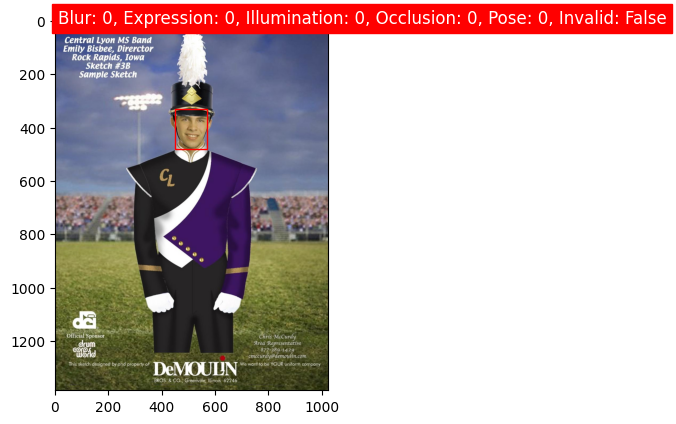

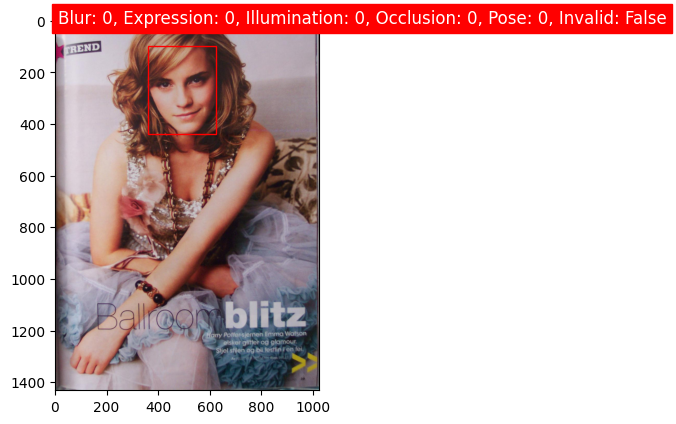

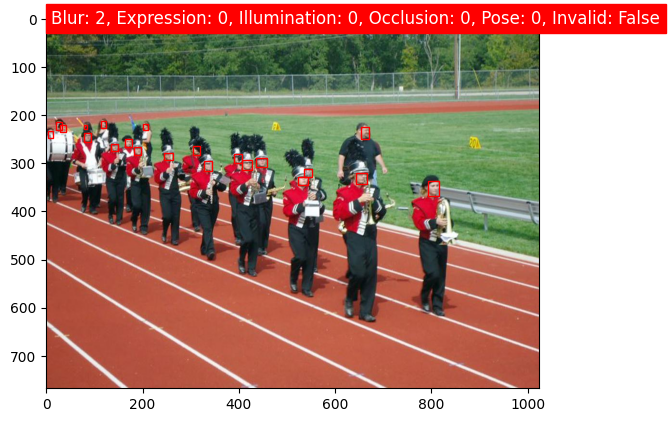

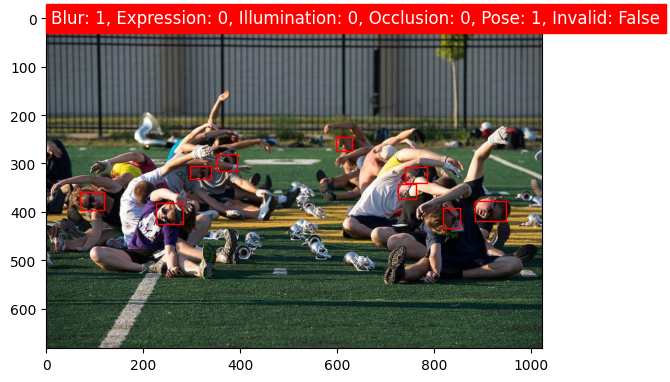

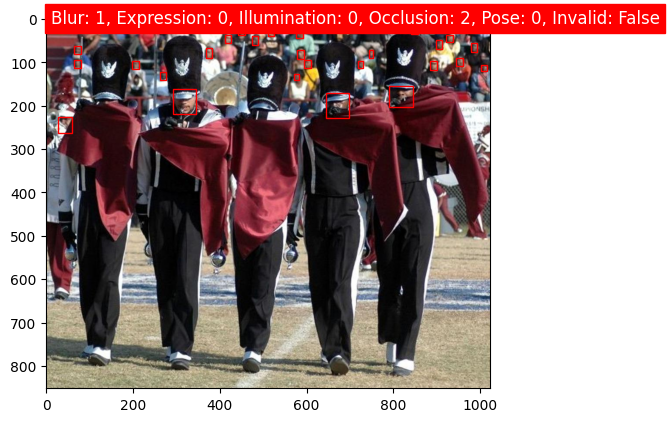

...

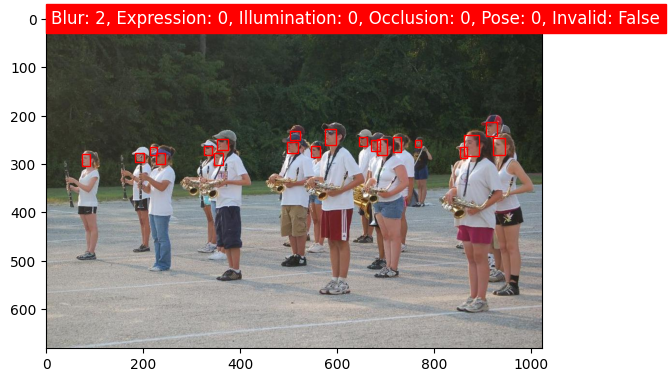

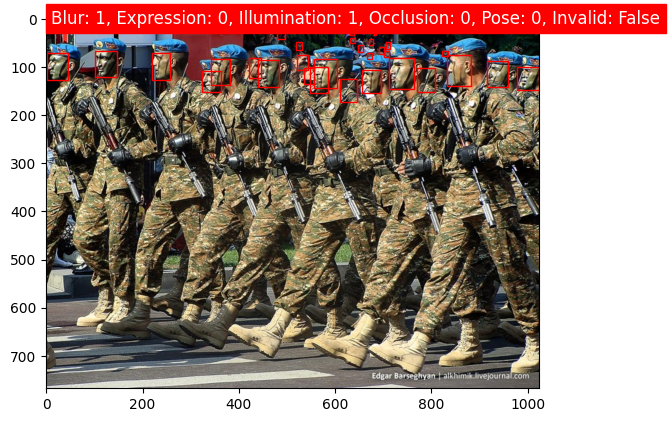

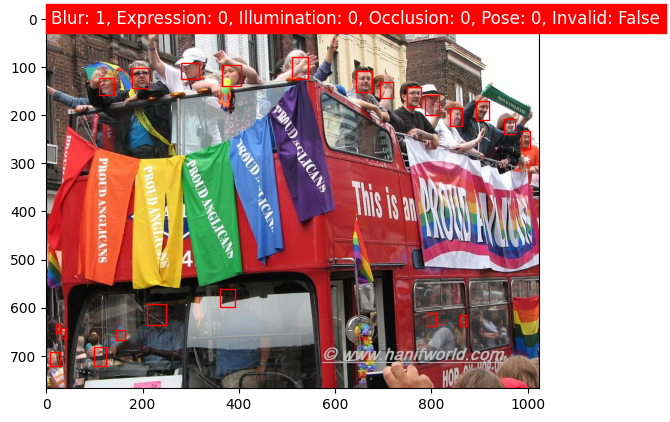

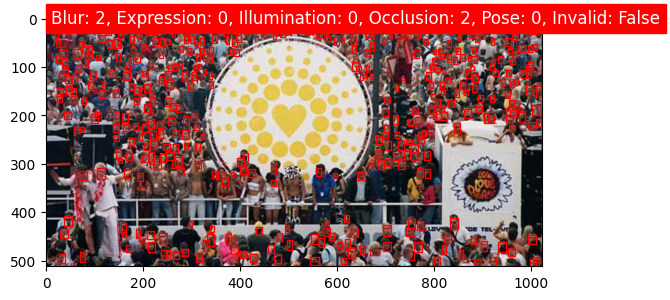

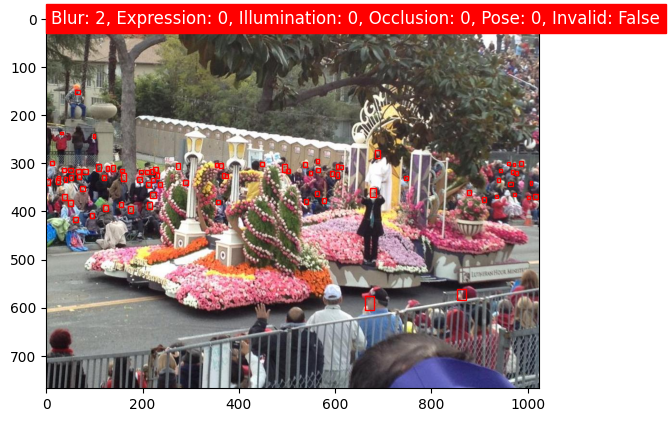

In [25]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
from datasets import load_dataset

def display_sample(sample):
    # Extract the image, bounding boxes, and labels
    image = sample['image']
    bboxes = sample['faces']['bbox']
    labels = sample['faces']

    # Create a figure and axes
    fig, ax = plt.subplots(1)

    # Display the image
    ax.imshow(image)

    # Add bounding boxes
    for bbox in bboxes:
        # Create a rectangle patch
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)
    # Add labels
    ax.text(10, 10, f"Blur: {labels['blur'][0]}, Expression: {labels['expression'][0]}, Illumination: {labels['illumination'][0]}, Occlusion: {labels['occlusion'][0]}, Pose: {labels['pose'][0]}, Invalid: {labels['invalid'][0]}", color='white', fontsize=12, backgroundcolor='red')

    # Show the figure
    plt.show()

# Assuming dataset is a list of samples
for sample in dataset:
    display_sample(sample)


In [ ]:
dataset = load_dataset("NekoJojo/modified_wider_face_train", split='train')

In [29]:

# Check keys of the first sample in the dataset
print("Keys in the first sample:", dataset[0].keys())

# Explore the structure of the first sample
print("Sample structure:", dataset[0])

# Access specific keys and their values
for key, value in dataset[0].items():
    print(f"Key: {key}, Value: {value}")


Keys in the first sample: dict_keys(['image', 'labels', 'bbox', 'valid_length', 'original_size', 'resized_bbox'])
Sample structure: {'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1385 at 0x7F74E50B2E00>, 'labels': [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'bbox': [[449.0, 330.0, 122.0, 149.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0

In [35]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import img_to_array
import numpy as np
from datasets import load_dataset

# Load your dataset
dataset = load_dataset("NekoJojo/modified_wider_face_train", split='train[:1000]')  # Load the first 1000 examples as a sample

# Prepare your data
images = []
bboxes = []
labels = []

for sample in dataset:
    # Preprocess each image
    img_array = img_to_array(sample['image'].resize((224, 224)))  # Resize the image to (224, 224) and convert to array
    images.append(img_array)

    # Normalize the bounding box coordinates
    bbox = sample['bbox'][0]
    bbox_normalized = [bbox[0] / sample['image'].width, bbox[1] / sample['image'].height,
                       bbox[2] / sample['image'].width, bbox[3] / sample['image'].height]
    bboxes.append(bbox_normalized)

    # Use the first label for each image
    label = sample['labels'][0]
    labels.append(label)

# Convert lists to numpy arrays
images = np.array(images)
bboxes = np.array(bboxes)
labels = np.array(labels)

# Load a pre-trained ResNet50 model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add new top layers to the model
x = base_model.output
x = Flatten()(x)
bbox_outputs = Dense(4, activation='sigmoid', name='bbox')(x)  # Output layer for bounding box predictions
label_outputs = Dense(1, activation='sigmoid', name='label')(x)  # Output layer for label predictions

# Create the new model
model = Model(inputs=base_model.input, outputs=[bbox_outputs, label_outputs])

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with multiple outputs and losses
model.compile(optimizer='adam',
              loss={'bbox': 'mean_squared_error', 'label': 'binary_crossentropy'},
              metrics={'bbox': ['mse'], 'label': ['accuracy']})

# Train the model
model.fit(images, {'bbox': bboxes, 'label': labels}, epochs=10)


Epoch 1/10
32/32 [==============================] - 172s 5s/step - loss: 0.3297 - bbox_loss: 0.1028 - label_loss: 0.2269 - bbox_mse: 0.1028 - label_accuracy: 0.9740
Epoch 2/10
20/32 [=================>............] - ETA: 1:04 - loss: 0.0967 - bbox_loss: 0.0967 - label_loss: 0.0000e+00 - bbox_mse: 0.0967 - label_accuracy: 1.0000

KeyboardInterrupt: 

In [36]:
# Print the number of examples and the first few samples
print("Number of examples:", len(dataset))
print("Sample data:")
for example in dataset[:5]:
    print(example)

Number of examples: 1000
Sample data:
image
labels
bbox
valid_length
original_size
resized_bbox


In [37]:


# Print the size and type of the first image
first_image = dataset[0]['image']
print("Size of the first image:", first_image.size)
print("Type of the first image:", type(first_image))

Size of the first image: (1024, 1385)
Type of the first image: <class 'PIL.JpegImagePlugin.JpegImageFile'>


In [38]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import img_to_array
import numpy as np
from datasets import load_dataset

# Load your dataset
dataset = load_dataset("NekoJojo/modified_wider_face_train", split='train[:1000]')  # Load the first 1000 examples for training

# Prepare your data
images = []
bboxes = []
labels = []

for sample in dataset:
    # Preprocess each image
    img_array = img_to_array(sample['image'].resize((224, 224)))  # Resize the image to (224, 224) and convert to array
    images.append(img_array)

    # Normalize the bounding box coordinates
    bbox = sample['bbox'][0]
    bbox_normalized = [bbox[0] / sample['image'].width, bbox[1] / sample['image'].height,
                       bbox[2] / sample['image'].width, bbox[3] / sample['image'].height]
    bboxes.append(bbox_normalized)

    # Use the first label for each image
    label = sample['labels'][0]
    labels.append(label)

# Convert lists to numpy arrays
images = np.array(images)
bboxes = np.array(bboxes)
labels = np.array(labels)

# Load a pre-trained EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add new top layers to the model
x = base_model.output
x = Flatten()(x)
bbox_outputs = Dense(4, activation='sigmoid', name='bbox')(x)  # Output layer for bounding box predictions
label_outputs = Dense(1, activation='sigmoid', name='label')(x)  # Output layer for label predictions

# Create the new model
model = Model(inputs=base_model.input, outputs=[bbox_outputs, label_outputs])

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with multiple outputs and losses
model.compile(optimizer='adam',
              loss={'bbox': 'mean_squared_error', 'label': 'binary_crossentropy'},
              metrics={'bbox': ['mse'], 'label': ['accuracy']})

# Train the model
history = model.fit(images, {'bbox': bboxes, 'label': labels}, epochs=10)

# Evaluate the model
eval_results = model.evaluate(images, {'bbox': bboxes, 'label': labels})

print("Evaluation results:")
print(" - Loss:", eval_results[0])
print(" - Bounding Box MSE:", eval_results[1])
print(" - Label Accuracy:", eval_results[2])


16705208/16705208 [==============================] - 0s 0us/step
Epoch 1/10
32/32 [==============================] - 75s 2s/step - loss: 0.1591 - bbox_loss: 0.0964 - label_loss: 0.0627 - bbox_mse: 0.0964 - label_accuracy: 0.9910
Epoch 2/10
32/32 [==============================] - 69s 2s/step - loss: 0.0873 - bbox_loss: 0.0873 - label_loss: 5.8966e-08 - bbox_mse: 0.0873 - label_accuracy: 1.0000
Epoch 3/10
32/32 [==============================] - 73s 2s/step - loss: 0.0843 - bbox_loss: 0.0842 - label_loss: 4.7262e-06 - bbox_mse: 0.0842 - label_accuracy: 1.0000
Epoch 4/10
32/32 [==============================] - 71s 2s/step - loss: 0.0825 - bbox_loss: 0.0825 - label_loss: 4.8187e-08 - bbox_mse: 0.0825 - label_accuracy: 1.0000
Epoch 5/10
32/32 [==============================] - 69s 2s/step - loss: 0.0815 - bbox_loss: 0.0815 - label_loss: 1.4619e-06 - bbox_mse: 0.0815 - label_accuracy: 1.0000
Epoch 6/10
32/32 [==============================] - 71s 2s/step - loss: 0.0792 - bbox_loss: 0.0792 

In [39]:
import numpy as np

# Assuming 'history' is the history object returned by model.fit
model_history = {
    'train_loss': history.history['loss'],
    'bbox_mse': history.history['bbox_mse'],
    'label_accuracy': history.history['label_accuracy']
}

# Save model history to a file
np.save('model_history.npy', model_history)


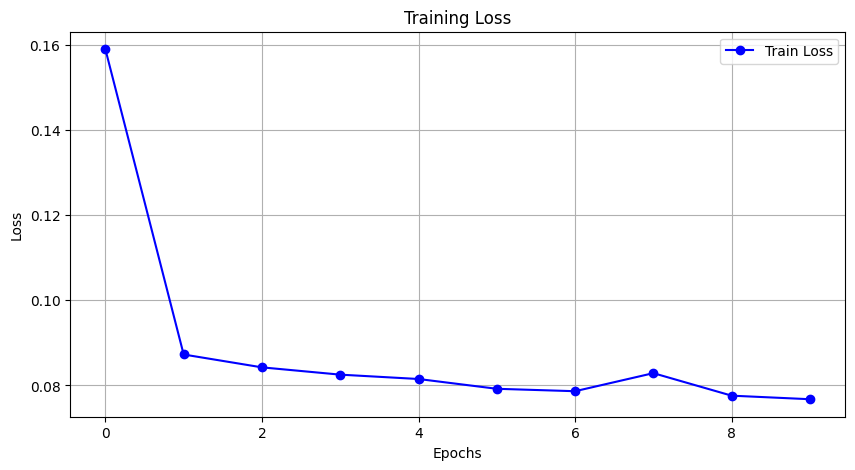

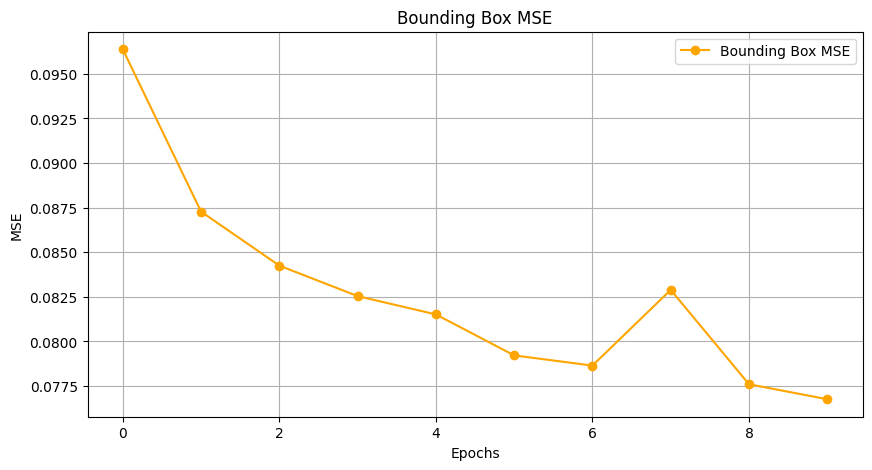

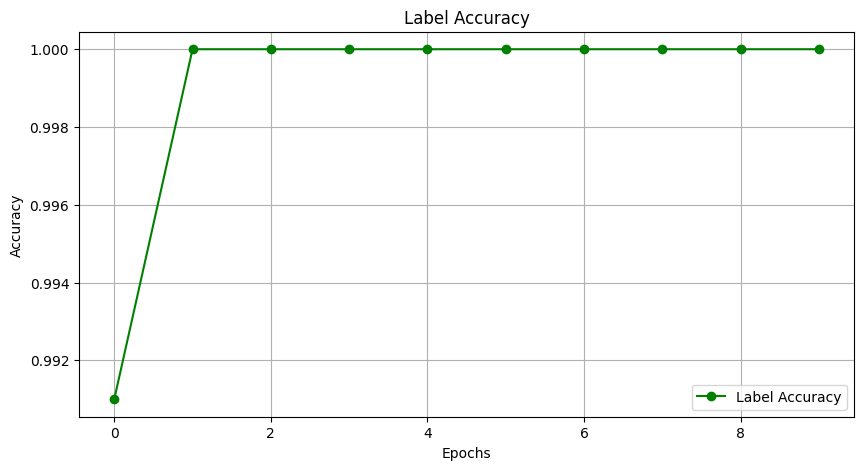

In [40]:
import matplotlib.pyplot as plt
import numpy as np

# Load model history
model_history = np.load('model_history.npy', allow_pickle=True).item()

# Extract data from model history
train_loss = model_history['train_loss']
bbox_mse = model_history['bbox_mse']
label_accuracy = model_history['label_accuracy']

# Plot training loss
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Train Loss', color='blue', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot bounding box MSE
plt.figure(figsize=(10, 5))
plt.plot(bbox_mse, label='Bounding Box MSE', color='orange', marker='o')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.title('Bounding Box MSE')
plt.legend()
plt.grid(True)
plt.show()

# Plot label accuracy
plt.figure(figsize=(10, 5))
plt.plot(label_accuracy, label='Label Accuracy', color='green', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Label Accuracy')
plt.legend()
plt.grid(True)
plt.show()


1/1 [==============================] - 5s 5s/step


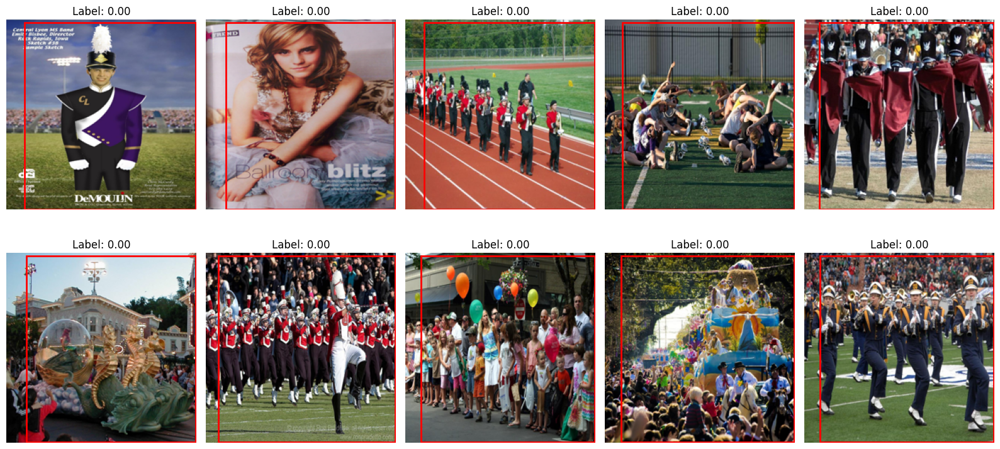

In [44]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array
from datasets import load_dataset

# Load example test images and preprocess
test_images = load_dataset("NekoJojo/modified_wider_face_train", split='train[:10]')  # Load first 10 images
preprocessed_images = []

for sample in test_images:
    img_array = img_to_array(sample['image'].resize((224, 224)))  # Resize the image to (224, 224) and convert to array
    img_array = img_array / 255.0  # Normalize pixel values to the range [0, 1]
    preprocessed_images.append(img_array)

preprocessed_images = np.array(preprocessed_images)

# Assuming 'model' is defined and trained correctly

# Obtain predictions from the model
bbox_predictions, label_predictions = model.predict(preprocessed_images)

# Visualize predictions with bounding boxes
fig, axes = plt.subplots(2, 5, figsize=(16, 8))  # Changed to 2 rows and 5 columns for 10 images
axes = axes.ravel()

for i in range(len(test_images)):
    img = preprocessed_images[i]  # Use preprocessed image

    # Check if predictions exist for this image
    if i < len(bbox_predictions) and i < len(label_predictions):
        bbox_pred = bbox_predictions[i]
        label_pred = label_predictions[i]

        # Plot image
        axes[i].imshow(img)
        axes[i].axis('off')

        # Overlay predicted bounding box
        x1, y1, x2, y2 = bbox_pred
        h, w, _ = img.shape
        x1_pixel = int(x1 * w)
        y1_pixel = int(y1 * h)
        x2_pixel = int(x2 * w)
        y2_pixel = int(y2 * h)
        axes[i].add_patch(plt.Rectangle((x1_pixel, y1_pixel), x2_pixel - x1_pixel, y2_pixel - y1_pixel,
                                         linewidth=2, edgecolor='r', facecolor='none'))

        # Display predicted label
        if isinstance(label_pred, np.ndarray):
            label_pred = label_pred.item()  # Convert numpy array to scalar
        axes[i].set_title(f'Label: {label_pred:.2f}')
    else:
        # If predictions are not available, display only the image
        axes[i].imshow(img)
        axes[i].axis('off')

plt.tight_layout()
plt.show()


In [45]:
print("Number of test images:", len(test_images))
print("Number of bbox predictions:", len(bbox_predictions))
print("Number of label predictions:", len(label_predictions))


Number of test images: 10
Number of bbox predictions: 10
Number of label predictions: 10


In [46]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from datasets import load_dataset
import random

# Define a simple CNN model
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(32 * 56 * 56, 128)
        self.fc2 = nn.Linear(128, 2)  # Assuming binary classification (face or non-face)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.max_pool2d(x, 2)
        x = torch.relu(self.conv2(x))
        x = torch.max_pool2d(x, 2)
        x = x.view(-1, 32 * 56 * 56)  # Flatten
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Load a small subset of the WIDER FACE dataset for demonstration
dataset = load_dataset("wider_face", split="train[:200]")  # Use only 200 samples for training

# Define transforms for preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Define a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        sample = self.dataset[idx]
        image = sample['image']
        label = 1 if 'faces' in sample else 0  # 1 if image contains faces, 0 otherwise
        if self.transform:
            image = self.transform(image)
        return image, label

# Create an instance of the custom dataset
custom_dataset = CustomDataset(dataset, transform=transform)

# Split the dataset into training and validation sets (you can adjust the split ratio as needed)
train_size = int(0.8 * len(custom_dataset))
val_size = len(custom_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(custom_dataset, [train_size, val_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

# Define the model, loss function, and optimizer
model = SimpleCNN()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
for epoch in range(5):  # Adjust the number of epochs as needed
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f"Epoch {epoch + 1}, Training Loss: {running_loss / len(train_loader)}")

# Validation loop
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in val_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f"Accuracy on validation set: {(100 * correct / total):.2f}%")


Epoch 1, Training Loss: 0.13839175701141357
Epoch 2, Training Loss: 0.0
Epoch 3, Training Loss: 0.0
Epoch 4, Training Loss: 0.0
Epoch 5, Training Loss: 0.0
Accuracy on validation set: 100.00%


In [48]:
import io

In [49]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from datasets import load_dataset
import random
from PIL import Image
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16
from keras.layers import Dense, Dropout, Flatten
from keras.models import Sequential
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.utils import to_categorical
import numpy as np

# Function to prepare data
def prepare_data(dataset, sample_size):
    images = []
    labels = []
    for i in range(sample_size):
        example = dataset[i]
        image = example['image'].convert('RGB')
        image = image.resize((224, 224))  # Resize based on the chosen model
        image = np.array(image)  # Correct way to convert PIL Image to numpy array
        images.append(image)

        # Access the label appropriately based on your dataset structure
        label = 1 if 'faces' in example else 0  # 1 if image contains faces, 0 otherwise
        labels.append(label)

    return np.array(images), np.array(labels)

# Load the modified WIDER FACE dataset
dataset = load_dataset("NekoJojo/modified_wider_face_train", split='train')

# Prepare data
images, labels = prepare_data(dataset, sample_size=1000)

# One-hot encode labels
labels = to_categorical(labels, num_classes=2)

# Split the data into training and validation sets
x_train, x_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=42)

# Define data augmentation techniques
train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    rescale=1./255
)
val_datagen = ImageDataGenerator(rescale=1./255)  # Validation data should not be augmented

train_generator = train_datagen.flow(x_train, y_train, batch_size=32)
val_generator = val_datagen.flow(x_val, y_val, batch_size=32)

# Load pre-trained VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))  # 2 output classes for the NekoJojo/modified_wider_face_train dataset

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(lr=1e-4),
              metrics=['accuracy'])

# Set callbacks
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('new_model.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

# Train the model
history=model.fit(train_generator,
          steps_per_epoch=len(x_train) // 32,
          validation_data=val_generator,
          validation_steps=len(x_val) // 32,
          epochs=10,
          callbacks=callbacks)

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_generator)
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

# Save the model
model.save('entire_model.h5')




58889256/58889256 [==============================] - 0s 0us/step


Epoch 1/10
 2/25 [=>............................] - ETA: 6:44 - loss: 0.2013 - accuracy: 0.9062

KeyboardInterrupt: 

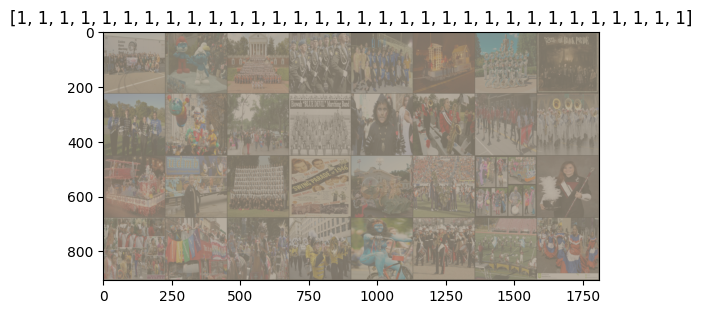

In [64]:
import matplotlib.pyplot as plt
import numpy as np
import torchvision
import torch

def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Get a batch of training data
images, labels = next(iter(val_loader))

# Make a grid from batch
out = torchvision.utils.make_grid(images)

imshow(out, title=[x.item() for x in labels])

# Convert images to PyTorch tensors
images = torch.stack([image for image in images])



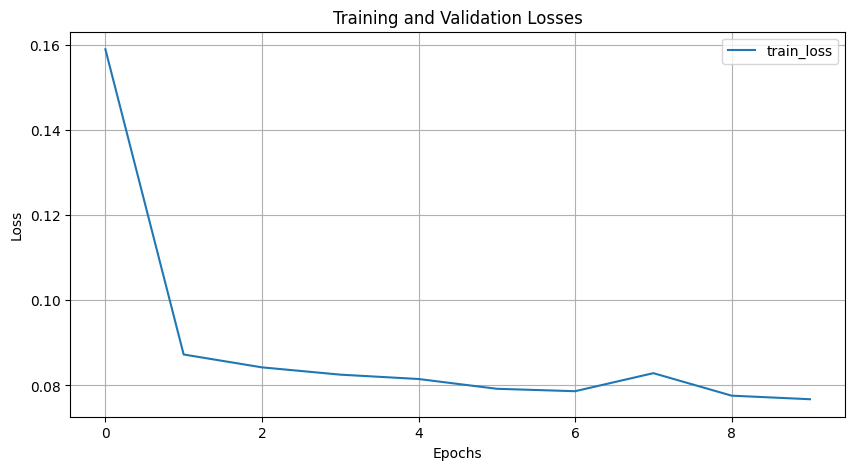

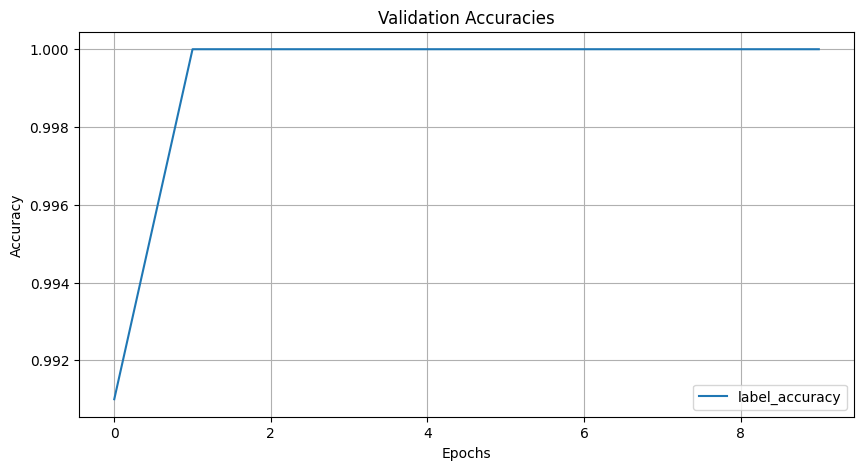

In [68]:
import matplotlib.pyplot as plt

def plot_model_history(model_history):
    """
    Plot the training history of a model.

    Args:
    - model_history (dict): Dictionary containing the training history.

    Returns:
    - None
    """
    # Determine the key names for losses and accuracies
    loss_keys = [key for key in model_history.keys() if 'loss' in key.lower()]
    accuracy_keys = [key for key in model_history.keys() if 'accuracy' in key.lower()]

    # Plot losses
    if loss_keys:
        plt.figure(figsize=(10, 5))
        for key in loss_keys:
            plt.plot(model_history[key], label=key)
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Training and Validation Losses')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Plot accuracies
    if accuracy_keys:
        plt.figure(figsize=(10, 5))
        for key in accuracy_keys:
            plt.plot(model_history[key], label=key)
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.title('Validation Accuracies')
        plt.legend()
        plt.grid(True)
        plt.show()

if __name__ == "__main__":
    # Load model history from file
    model_history = np.load('/content/model_history.npy', allow_pickle=True).item()

    # Plot model history
    plot_model_history(model_history)
